In [9]:
import numpy as np

class Board:
    def __init__(self):
        self.size = 20
        self.players = [] #Define a list of players on the map
        self.boxes = [] #Define a list for the boxes on the map
        self.observation = np.zeros((2*self.size, 2*self.size, 2))
    
    def init_observation(self):
        for i in range(int(self.size*2)):
            t_x = i - self.size
            for j in range(int(self.size*2)):
                t_y = j - self.size
                for box in self.boxes:
                    if box.in_box(t_x, t_y):
                        self.observation[j][i][0] = 1
                        break

                for player in self.players:
                    if t_x == player.x and t_y == player.y:
                        self.observation[j][i][1] = 1
                        break
    
    def update_observation(self): #Boxes are stationary and so you do not need to update this
        for i in range(int(self.size*2)):
            t_x = i - self.size
            for j in range(int(self.size*2)):
                t_y = j - self.size
                for player in self.players:
                    if t_x == player.x and t_y == player.y:
                        self.observation[j][i][1] = 1
                        break
        
    
    def add_player(self, player):
        self.players.append(player)
    
    def add_box(self, box):
        self.boxes.append(box)
    
    def in_board(self, objectx, objecty):
        if objectx <= self.size and objectx >= -self.size:
            if objecty <= self.size and objecty >= -self.size:
                return True

In [10]:
from enum import Enum
import numpy as np

class Direction(Enum):
    UP = 1
    DOWN = 2
    LEFT = 3
    RIGHT = 4

class Box:
    def __init__(self, size, centerX, centerY, board):
        self.size = size
        self.x = centerX
        self.y = centerY
        self.board = board
        self.board.add_box(self)
    
    def in_box(self, objectx, objecty):
        if objectx <= self.x + self.size/2 and objectx >= self.x - self.size/2:
            if objecty <= self.y + self.size/2 and objecty >= self.y - self.size/2:
                return True
        
        

class Weapon:
    def __init__(self, damage, rate, clip, speed, range):
        self.damage = damage 
        self.rate = rate
        self.clip = clip
        self.speed = speed
        self.range = range
        self.mag = clip
    
class Player:
    def __init__(self, centerX, centerY, team, weapon, view, board):
        self.size = 1
        self.x = centerX
        self.y = centerY 
        self.team = team #what team are they on
        self.weapon = weapon #What weapon will be equipped
        self.view = view #0 - 2pi.. where they are looking
        self.hp = 100
        self.board = board #define what map the player is on 
        self.board.add_player(self)
        self.fov = np.deg2rad(110) #The player's field of view
    
    def view_mask(self): #return a mask of what pixels the player can see(1 where you can view and 0 where you cannot)
        view_width = 3 #how many units wide their view is
        view_length = 40 #how far they can see
        mask = np.zeros((self.board.size*2, self.board.size*2))
        
        perp_view = self.view + np.deg2rad(90)
        for k in range(view_width):
            offsetx = (k - 1)*np.cos(perp_view)
            offsety = (k - 1)*np.sin(perp_view)
            
            for t in range(view_length):
                rise = t*np.sin(self.view)
                run = t*np.cos(self.view)
                
                viewx = int(offsetx + run + self.x) + 20
                viewy = int(offsety + rise + self.y) + 20
                
                if viewx >= 0 and viewx <= 39:
                    if viewy >= 0 and viewy <= 39:
                        if self.board.observation[viewy][viewx][0] == 1: #There is a box on this pixel
                            break #Don't look any further!
                        mask[viewy][viewx] = 1
        
        return mask  
    
    def move(self, direction): #Move players position
        if self.hp > 0:
            tempx = self.x
            tempy = self.y
            
            if direction == Direction.UP:
                self.y += self.weapon.speed
            elif direction == Direction.DOWN:
                self.y -= self.weapon.speed
            elif direction == Direction.LEFT:
                self.x -= self.weapon.speed
            elif direction == Direction.RIGHT:
                self.x += self.weapon.speed
            
            for box in self.board.boxes: #Check movement collisions with boxes
                if box.in_box(self.x, self.y):
                    self.x = tempx
                    self.y = tempy
            
            if not self.board.in_board(self.x, self.y):
                self.x = tempx
                self.y = tempy
                    
                    
    
    def set_view(self, new_view):
        self.view = new_view
    
    def fire(self): #Fire your weapon
        if self.hp > 0:
            vectX = np.cos(self.view)
            vectY = np.sin(self.view)

            for i in range(len(self.board.players)):
                player = self.board.players[i]

                if player != self:
                    Y = player.y - self.y
                    X = player.x - self.x
                    scalar = (X * vectX + Y * vectY)/(np.square(vectX) + np.square(vectY))
                    if scalar >= 0:
                        projX = scalar * vectX
                        projY = scalar * vectY
                        dist = np.square(Y - projY) + np.square(X - projX)
                        if dist <= np.square(0.5): #If our weapon has hit
                            player.hp -= self.weapon.damage
                            self.board.players[i] = player
                

In [11]:
class Team(Enum):
    CT = 0
    T = 1

In [12]:
def update_plot(t, offset, color, scat):
    scat.set_offsets(offset[t])
    scat.set_array(color[t])
    counts[0].set_text(f"Player 1 HP: {color[t][0]/2.56}")
    counts[1].set_text(f"Player 2 HP: {color[t][1]/2.56}")
    return scat

In [13]:
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import clear_output
from matplotlib import animation, rc
from IPython.display import HTML
import time
rc('animation', html='jshtml')


frames = 600


ak1 = Weapon(50, 1, 30, 2, 40)
ak2 = Weapon(50, 1, 30, 2, 40)
Map = Board()
p1 = Player(-10, 16, Team.T, ak1, 0, Map)
p2 = Player(-5, -16, Team.CT, ak2, 0, Map)

box1 = Box(10, -7.5, -10, Map)
box2 = Box(10, 13.5, -10, Map)
box3 = Box(10, -10, 10, Map)
box4 = Box(10, 10, 10, Map)

num_players = len(Map.players)
offsets = np.zeros((frames, num_players, 2))
colors = np.zeros((frames, num_players))
Map.init_observation()

for i in range(frames):
    for j in range(num_players):
        p = Map.players[j]
        p.hp = np.maximum(0, p.hp)
        offsets[i][j][0] = p.x
        offsets[i][j][1] = p.y
        colors[i][j] = int(p.hp * 2.56)
        
        rand = np.random.rand()*4
        if rand <= 1:
            p.move(Direction.UP)
        elif rand > 1 and rand <= 2:
            p.move(Direction.DOWN)
        elif rand > 2 and rand <= 3:
            p.move(Direction.RIGHT)
        else:
            p.move(Direction.LEFT)
            
        Map.players[j] = p
        Map.update_observation()

In [14]:
print("Map: ", Map.observation)
for player in Map.players:
    print("View angle: ", player.view)
    view_mask = player.view_mask()
    for i in range(int(Map.size*2)):
        print(view_mask[i])


Map:  [[[0. 0.]
  [0. 0.]
  [0. 0.]
  ...
  [0. 0.]
  [0. 0.]
  [0. 0.]]

 [[0. 0.]
  [0. 0.]
  [0. 0.]
  ...
  [0. 0.]
  [0. 0.]
  [0. 0.]]

 [[0. 0.]
  [0. 0.]
  [0. 0.]
  ...
  [0. 0.]
  [0. 0.]
  [0. 0.]]

 ...

 [[0. 0.]
  [0. 0.]
  [0. 0.]
  ...
  [0. 0.]
  [0. 0.]
  [0. 0.]]

 [[0. 1.]
  [0. 0.]
  [0. 1.]
  ...
  [0. 0.]
  [0. 0.]
  [0. 0.]]

 [[0. 0.]
  [0. 0.]
  [0. 0.]
  ...
  [0. 0.]
  [0. 0.]
  [0. 0.]]]
View angle:  0
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.


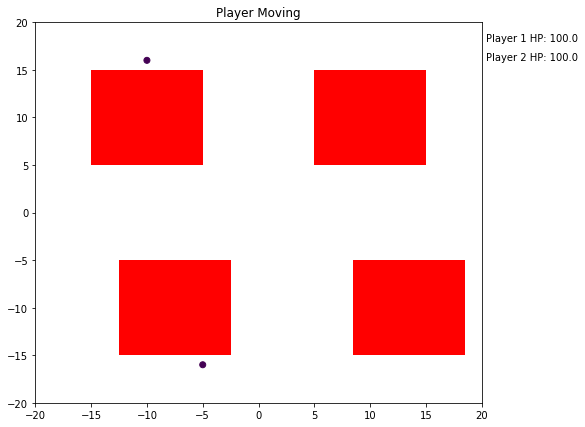

In [15]:
#offsets = np.array(offsets)
#colors = np.array(colors)
fig, ax = plt.subplots(figsize=(10, 7))
ax.set_xlim((-Map.size, Map.size))
ax.set_ylim((-Map.size, Map.size))

for box in Map.boxes:
    rect = plt.Rectangle((box.x - box.size/2, box.y - box.size/2), box.size, box.size, fc="red")
    plt.gca().add_patch(rect)



box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height]) # Shrink current axis by 20%
counts = [ax.text(1.01, 0.95-i*0.05,  '', transform=ax.transAxes) for i in range(2)]
scat = plt.scatter(np.zeros(num_players), np.zeros(num_players), c=colors[100])
plt.title("Player Moving") 
anim = animation.FuncAnimation(fig, update_plot, frames=frames,
                              fargs=(offsets, colors, scat), interval=(frames/60))

In [16]:
anim

In [17]:
#Implement the convolutional neural network
import keras
import numpy as np

from keras.models import Model
from keras.layers import Input, Add, Dense, Activation, ZeroPadding2D, BatchNormalization, Flatten, Conv2D, MaxPooling2D, AveragePooling2D, Concatenate, Dropout, AlphaDropout
from keras.layers import GlobalAveragePooling2D, Multiply, Permute, Reshape
from keras.optimizers import SGD
from keras.initializers import glorot_uniform
from keras.regularizers import l1, l2
from keras import backend as K

lambd = 0.001 #L2 regularization

def stem(X, filters, stage="stem", size=3):
    stem = Conv2D(filters=filters, kernel_size=(size,size), strides=(1,1), padding='same', data_format='channels_last', 
                  name='Conv_' + stage, kernel_initializer=glorot_uniform(), kernel_regularizer=l2(lambd))(X)
    stem = Activation('relu')(stem)
    return stem

def res_block(X, filters, block, size=3):
    res = Conv2D(filters=filters, kernel_size=(size,size), strides=(1,1), padding='same', data_format='channels_last', 
                name='res_block1_' + block, kernel_initializer=glorot_uniform(), kernel_regularizer=l2(lambd))(X)
    res = Activation('relu')(res)
    res = Conv2D(filters=filters, kernel_size=(size,size), strides=(1,1), padding='same', data_format='channels_last', 
                name='res_block2_' + block, kernel_initializer=glorot_uniform(), kernel_regularizer=l2(lambd))(res)
    
    X = Add()([X, res])
    X = Activation('relu')(X)
    return X

def model(filters, resblocks=5):
    image = Input(shape=(40, 40, 4)) #Masked images of two players
    player1_data = Input(shape=(3,)) #Data about first player it controls [hp, weapon, time-left]
    player2_data = Input(shape=(3,)) #Data about second player
    
    #Stem for our resnet
    X = stem(image, 32)
    
    #Resnet
    for i in range(resblocks):
        X = res_block(X, filters, str(i + 1))
    
    #Create latent representation
    latent = stem(X, 32, stage="latent", size=1)
    latent = Flatten()(latent)
    latent = Concatenate()([latent, player1_data, player2_data])
    
    #Create view changes for player1 [-90, -80, ... 0, ... 80, 90]
    view1 = Dense(19, activation="softmax", name="fcView1", kernel_initializer=glorot_uniform(),
                kernel_regularizer = l2(lambd))(latent)
    
    view2 = Dense(19, activation="softmax", name="fcView2", kernel_initializer=glorot_uniform(),
                kernel_regularizer = l2(lambd))(latent)
    
    #Create policy for player 1 [Fire, Left, Right, Up, Down]
    policy1 = Dense(5, activation="softmax", name="fcPolicy1", kernel_initializer=glorot_uniform(),
                kernel_regularizer = l2(lambd))(latent)
    
    #Create policy for player 2
    policy2 = Dense(5, activation="softmax", name="fcPolicy1", kernel_initializer=glorot_uniform(),
                kernel_regularizer = l2(lambd))(latent)
    
    #Create value function for actor critic
    value = Dense(1, activation="sigmoid", name="fcValue", kernel_initializer=glorot_uniform(),
                kernel_regularizer = l2(lambd))(latent)
    
    #Create model
    model = Model(inputs=[image, player1_data, player2_data],
                 outputs=[view1, view2, policy1, policy2, value], name='CSAI')
    
    #Online Learning training function
    p1 = K.clip(policy1, 1e-6, 1)
    p2 = K.clip(policy2, 1e-6, 1)
    v1 = K.clip(view1, 1e-6, 1)
    v2 = K.clip(view2, 1e-6, 1)
    
    #placeholder variables for PPO algorithm
    advantages = K.placeholder(shape=(None,1), name="advantages")
    target = K.placeholder(shape=(None,1), name="target_value")
    
    action1 = K.placeholder(shape=(None,5), name="action1")
    action2 = K.placeholder(shape=(None,5), name="action1")
    p1_old = K.placeholder(shape=(None,5), name="p1_old")
    p2_old = K.placeholder(shape=(None,5), name="p2_old")
    v1_t = K.placeholder(shape=(None,19), name="v1")
    v2_t = K.placeholder(shape=(None,19), name="v2")
    v1_old = K.placeholder(shape=(None,19), name="view1_old")
    v2_old = K.placeholder(shape=(None,19), name="view2_old")
    
    ratio1 = K.sum(action1 * (p1/p1_old))
    ratio2 = K.sum(action2 * (p2/p2_old))
    ratiov1 = K.sum(v1_t * (v1/v1_old))
    ratiov2 = K.sum(v2_t * (v2/v2_old))
    
    Lclip1 = K.minimum(ratio1*advantages, K.clip(ratio1,  0.8, 1.2)*advantages)
    Lclip2 = K.minimum(ratio2*advantages, K.clip(ratio2,  0.8, 1.2)*advantages)
    Lclipv1 = K.minimum(ratiov1*advantages, K.clip(ratiov1,  0.8, 1.2)*advantages)
    Lclipv2 = K.minimum(ratiov2*advantages, K.clip(ratiov2,  0.8, 1.2)*advantages)
    MSE = K.squeeze(K.square(target-value), 1)
    loss = K.mean(Lclip1 + Lclip2 + Lclipv1 + Lclipv2 + MSE, axis=0)
    
    c1_print = K.mean(Lclip1, axis=0)
    c2_print = K.mean(Lclip2, axis=0)
    cv1_print = K.mean(Lclipv1, axis=0)
    cv2_print = K.mean(Lclipv2, axis=0)
    v_print = K.mean(MSE, axis=0)
    
    #optimizer
    opt = keras.optimizers.SGD(1e-4)
    updates = opt.get_updates(params=model.trainable_weights, loss=loss)
    train_fn = K.function(inputs=[model.input, advantages, target,
                                 action1, action2, p1_old, p2_old, v1_t, v2_t,
                                 v1_old, v2_old], outputs=[c1_print, c2_print,
                                                          cv1_print, cv2_print, v_print], updates=updates)
    
    return model, train_fn

Using TensorFlow backend.
